In [1]:
!pip install omnipath
!pip install gprofiler-official
!pip install openpyxl

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import umap
import umap.plot
import numpy as np
import os
import math
import warnings
import gseapy as gp
import anndata as ad
import seaborn.objects as so
import skmisc
import decoupler as dc
from gprofiler import GProfiler

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Preprocessing

In [2]:
data_dir = 'C:/Users/LNCT/Desktop/GBMap_last/b46e8034-67ab-4b5c-8b74-43aebe9ee7e7.h5ad'
out = "C:/Users/LNCT/Desktop/GBMap_last/UMAP"

In [ ]:
adata = sc.read_h5ad('C:/Users/LNCT/Desktop/GBMap_last/b46e8034-67ab-4b5c-8b74-43aebe9ee7e7.h5ad')
adata

In [ ]:
## subsampling dataset
adata_sub = sc.pp.subsample(adata, 0.3, copy=True) # "copy = true" will bring the whole AnnData object
adata_sub

In [ ]:
## only 10x datasets ##
assays = adata_sub.obs['assay'].unique().astype(str)
print(assays)

short_assay = ["10x 3' v2", "'10x 3' v3", "10x 5' v1"]
adata_red = adata_sub[adata_sub.obs['assay'].isin(short_assay)]

In [ ]:
## normalize and cluster ##
adata_red.X = adata_red.raw.X.copy()
sc.pp.normalize_total(adata_red, target_sum=1e4)
sc.pp.log1p(adata_red)

sc.pp.neighbors(
    adata_red, 
    n_neighbors = 9, 
    n_pcs = 21
    )

sc.tl.leiden(
    adata_red,
    resolution = 0.1,
    key_added = "leiden_r0.1"
    )

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


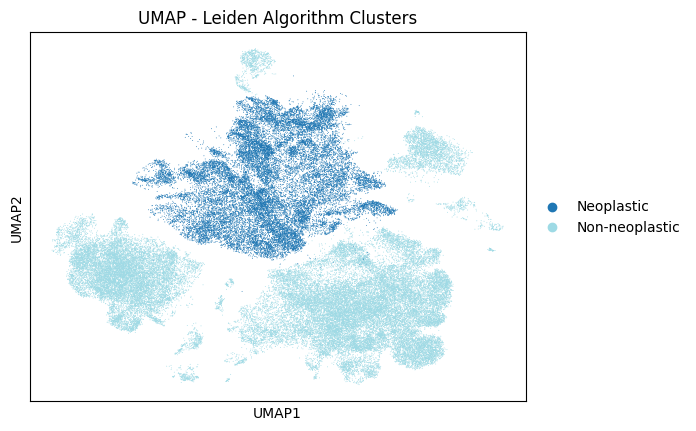

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


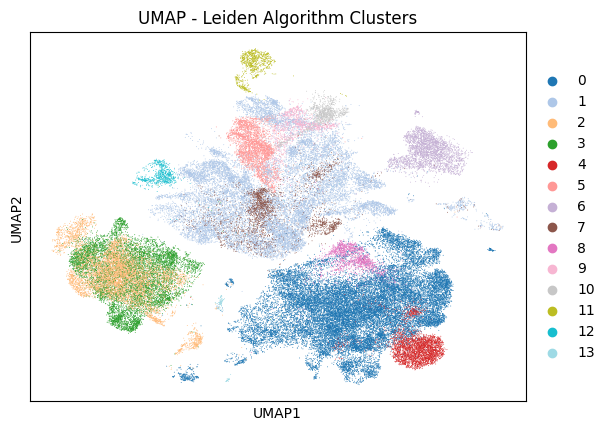

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


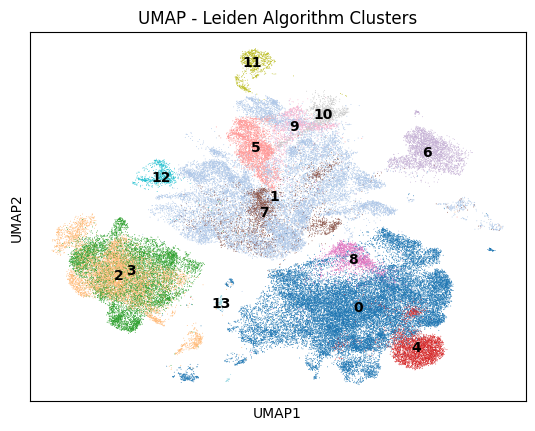

In [8]:
sc.pl.umap(
    adata_red,
    color = "annotation_level_1", 
    palette = "tab20",
    title = "UMAP - Leiden Algorithm Clusters",
    save = "Umap_allcells_annotation_level_1.png"
    )


sc.pl.umap(
    adata_red,
    color = "leiden_r0.1", 
    palette = "tab20",
    title = "UMAP - Leiden Algorithm Clusters",
    save = "Umap_allcells_leiden_r0.1.png"
    )

sc.pl.umap(
    adata_red,
    color = "leiden_r0.1", 
    palette = "tab20",
    legend_loc = "on data",
    title = "UMAP - Leiden Algorithm Clusters",
    save = "Umap_allcells_leiden_ondataleg_r0.1.png"
    )

# Analysis using only neoplastic cells

In [7]:
target_neoplastic = ["Neoplastic"]
adata_neoplastic  = adata_red[(adata_red.obs["annotation_level_1"].isin(target_neoplastic))]

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


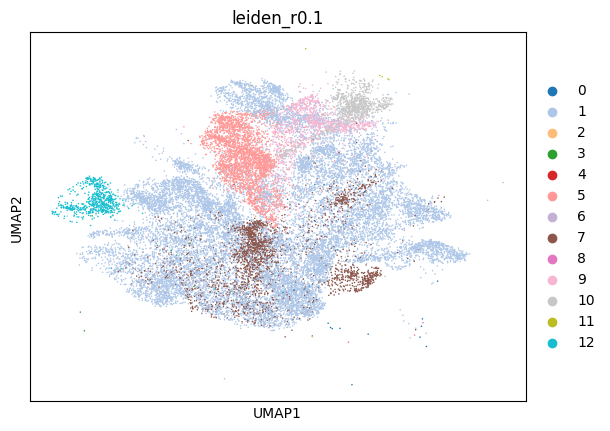

In [10]:
sc.pl.umap(
    adata_neoplastic,
    color = "leiden_r0.1"
)

In [8]:
## normalize and cluster ##
adata_neoplastic.X = adata_neoplastic.raw.X.copy()
sc.pp.normalize_total(adata_neoplastic, target_sum=1e4)
sc.pp.log1p(adata_neoplastic)

sc.pp.neighbors(
    adata_neoplastic, 
    n_neighbors = 9, 
    n_pcs = 21
    )

sc.tl.leiden(
    adata_neoplastic,
    resolution = 0.1,
    key_added = "leiden_r0.1"
    )

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


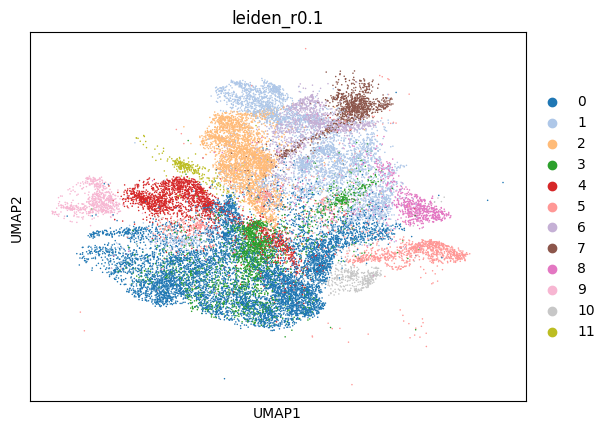

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


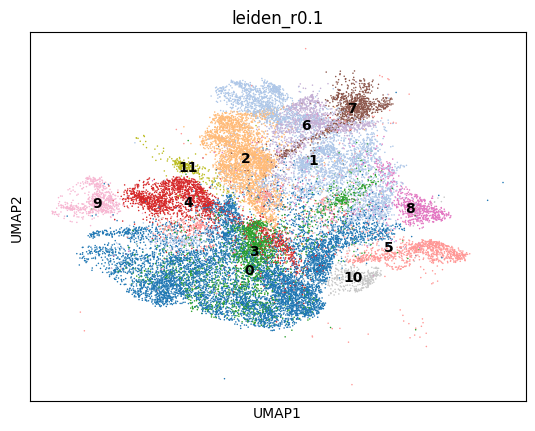

In [12]:
sc.pl.umap(
    adata_neoplastic,
    color = "leiden_r0.1",
    save = "umap_neoplastic_leiden_legrm.png"
    )

sc.pl.umap(
    adata_neoplastic,
    color = "leiden_r0.1",
    legend_loc = "on data",
    save = "umap_neoplastic_leiden.png"
    )

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

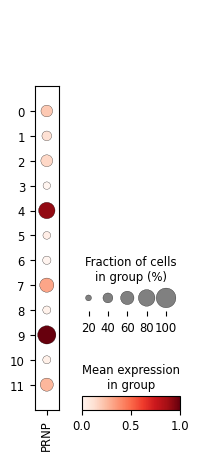

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

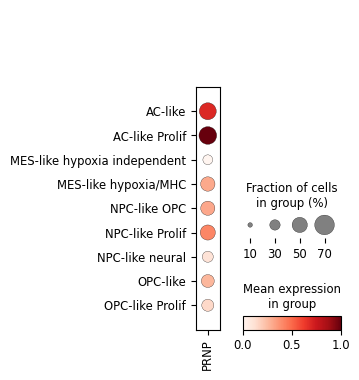

In [13]:
sc.pl.dotplot(
    adata_neoplastic,
    "PRNP",
    groupby = "leiden_r0.1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "leiden_r0.1_prnp_dotplot.png"
)

sc.pl.dotplot(
    adata_neoplastic,
    "PRNP",
    groupby = "annotation_level_4",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "annotation4_prnp_dotplot.png"
)

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


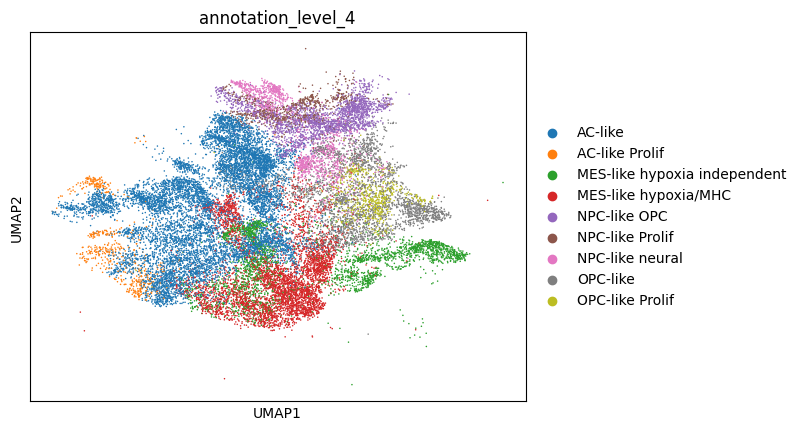

In [14]:
sc.pl.umap(
    adata_neoplastic,
    color = "annotation_level_4",
    save = "umap_neoplastic_annot4.png"
)

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

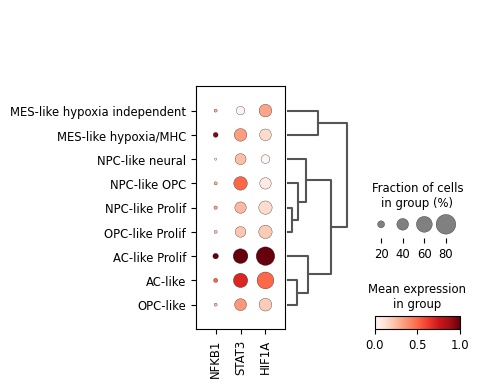

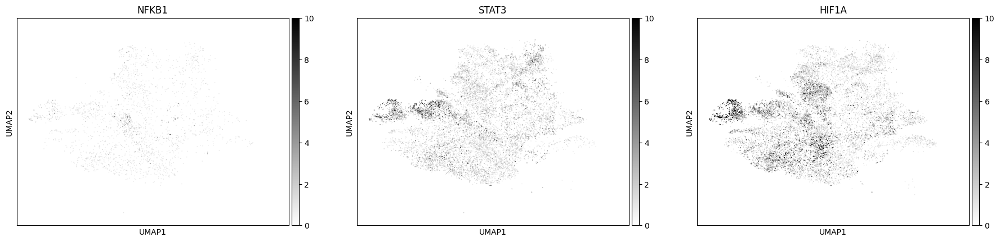

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

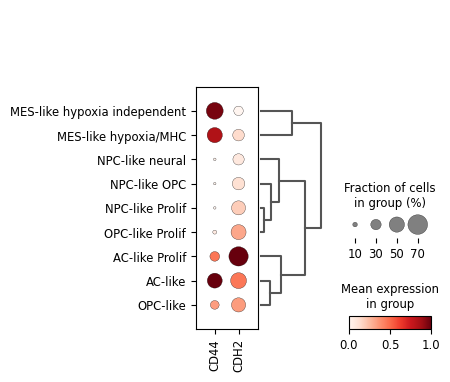

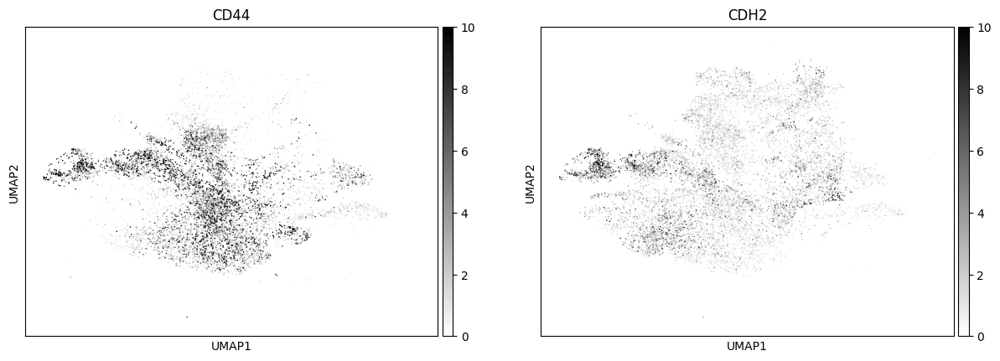

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

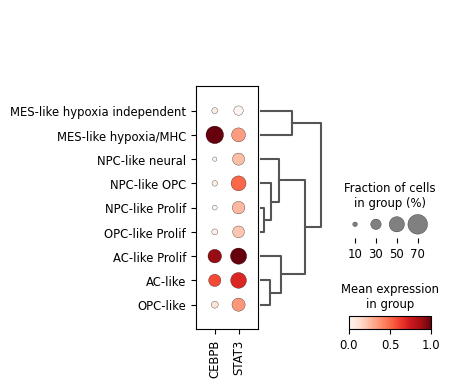

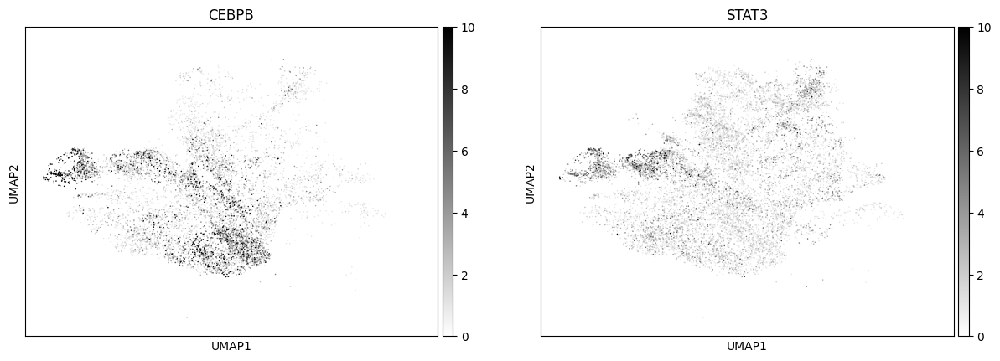

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

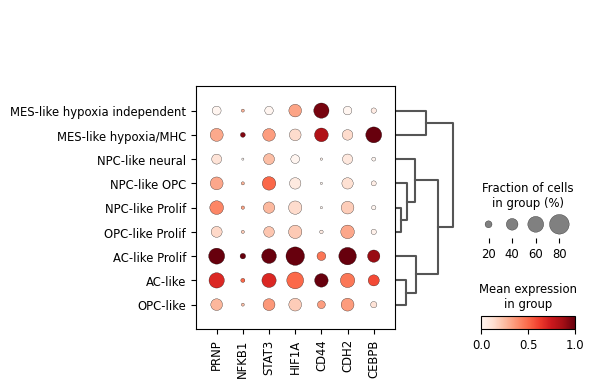

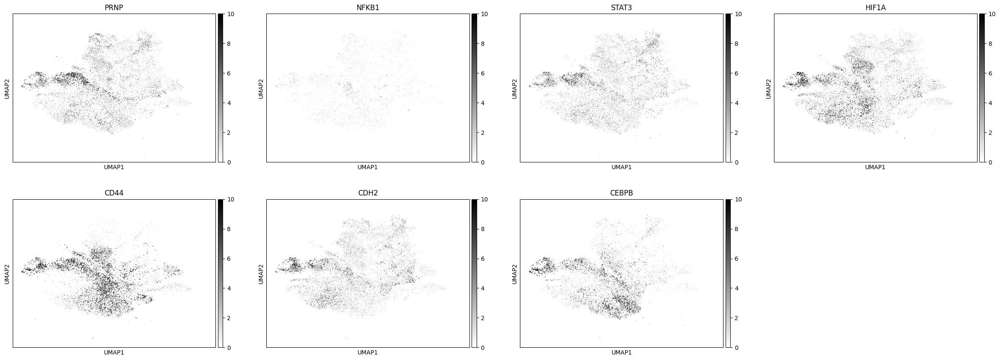

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

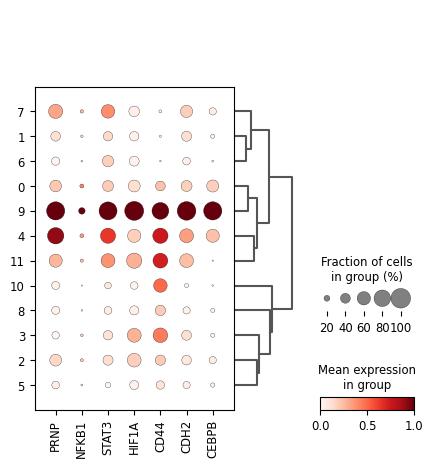

In [76]:
# TFs NF-κB STAT3 HIF-1α  Proteinas CD44 N-cadherin # Master Regulators  C/EBPb STAT3

# tfs

sc.pl.dotplot(
    adata_neoplastic,
    ["NFKB1", "STAT3", "HIF1A"],
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_MESTFS_annotation4.png",
    standard_scale = "var"
)

sc.pl.umap(
    adata_neoplastic,
    color =  ["NFKB1", "STAT3", "HIF1A"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_MESTFS_annotation4.png"
)

# Proteínas

sc.pl.dotplot(
    adata_neoplastic,
    ["CD44", "CDH2"],
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    standard_scale = "var",
    save="dotplot_MESPROT_annotation4.png"
)

sc.pl.umap(
    adata_neoplastic,
    color = ["CD44", "CDH2"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_MESPROT_annotation4.png"
)

# Master Regulators

sc.pl.dotplot(
    adata_neoplastic,
    ["CEBPB", "STAT3"],
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    standard_scale = "var",
    save="dotplot_MESMR_annotation4.png"
)

sc.pl.umap(
    adata_neoplastic,
    color =  ["CEBPB", "STAT3"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_MESMR_annotation4.png"
)

# PRNP and all


sc.pl.dotplot(
    adata_neoplastic,
    ["PRNP", "NFKB1", "STAT3", "HIF1A", "CD44", "CDH2", "CEBPB"],
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_MESTFS_PRNP_annotation4.png",
    standard_scale = "var"
)

sc.pl.umap(
    adata_neoplastic,
    color =  ["PRNP", "NFKB1", "STAT3", "HIF1A", "CD44", "CDH2", "CEBPB"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_MESTFS_PRNP_annotation4.png"
)

sc.pl.dotplot(
    adata_neoplastic,
    ["PRNP", "NFKB1", "STAT3", "HIF1A", "CD44", "CDH2", "CEBPB"],
    groupby='leiden_r0.1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_MESTFS_PRNP_clusters.png",
    standard_scale = "var"
)


## Molecular subtypes analysis

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. 

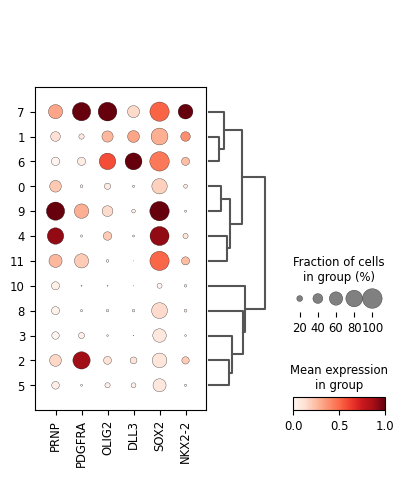

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. 

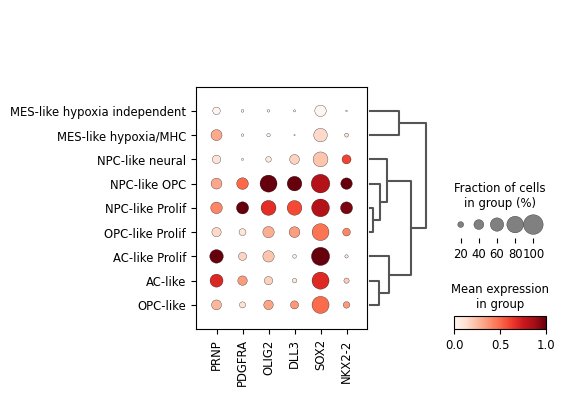

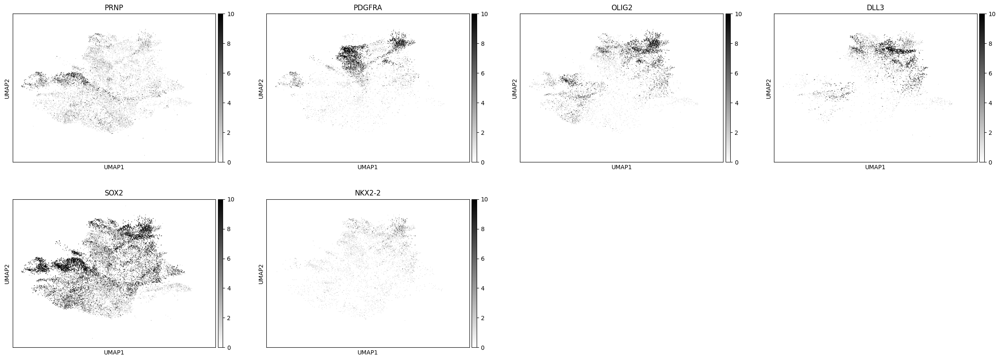

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

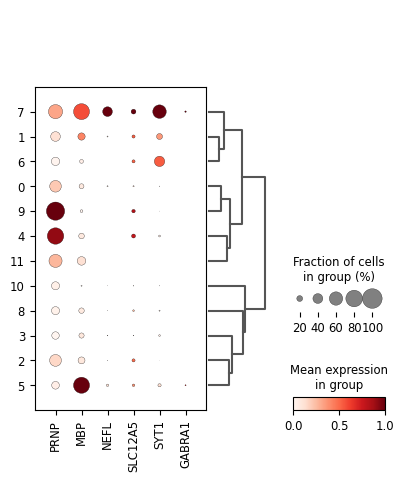

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

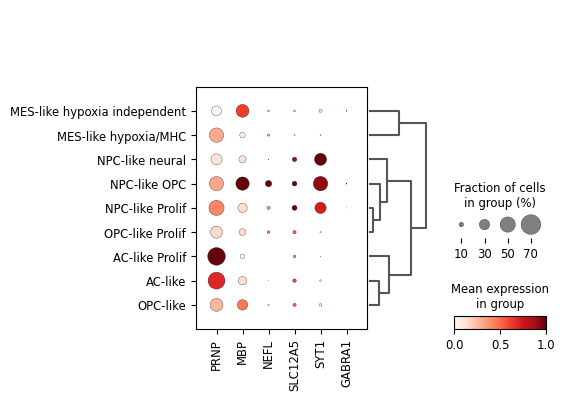

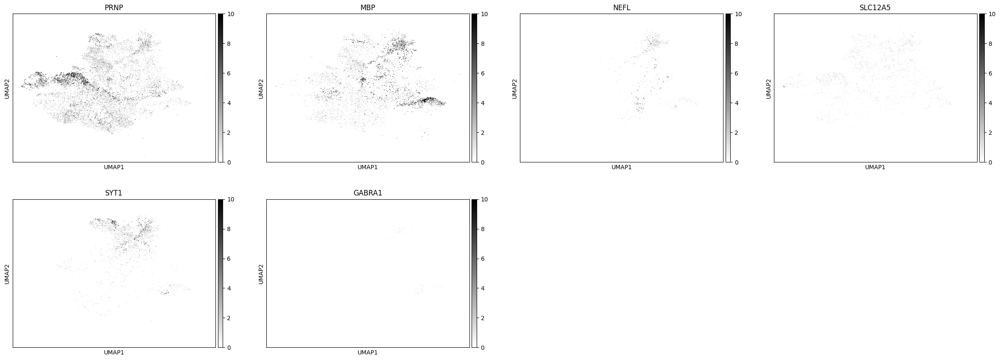

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

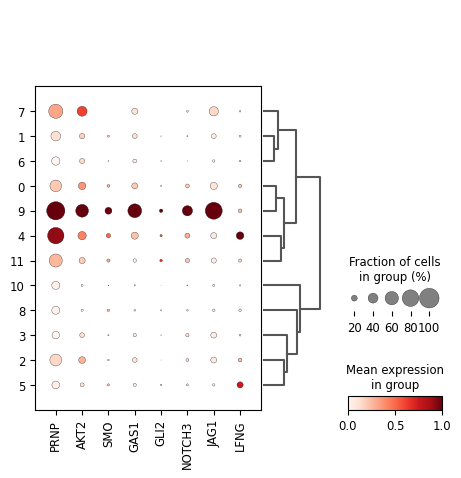

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

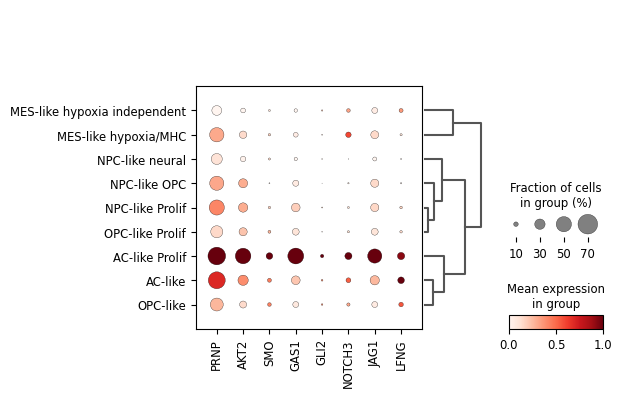

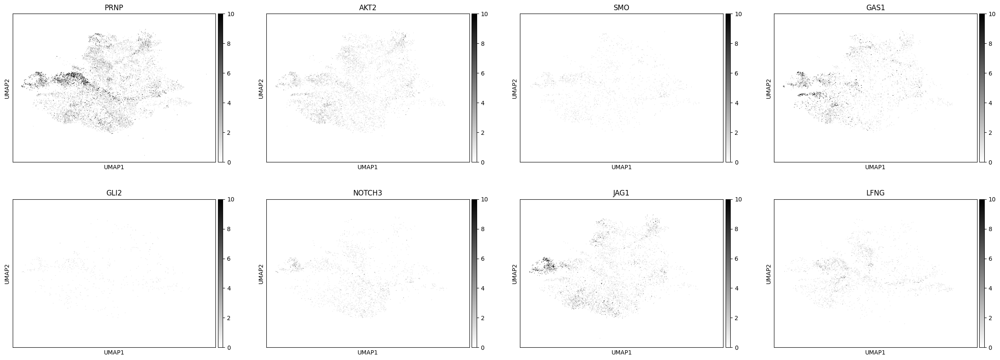

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

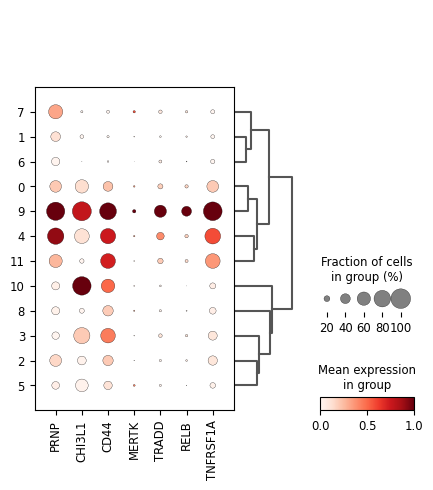

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

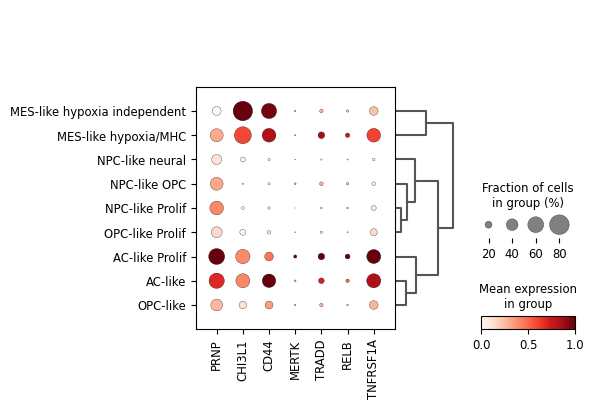

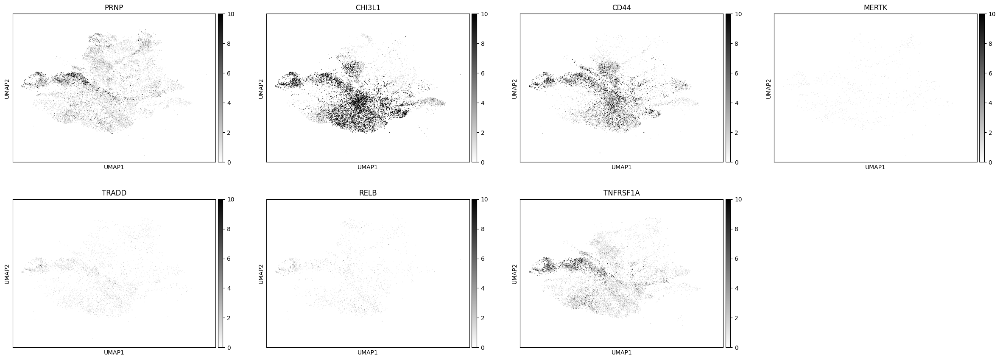

In [27]:
markers_proneural = ["PRNP","PDGFRA", "OLIG2", "DLL3" , "SOX2", "NKX2-2"]

markers_proliferative = ["PRNP", "MBP", "NEFL", "SLC12A5", "SYT1", "GABRA1"]

markers_classical = ["PRNP", "AKT2", "SMO", "GAS1", "GLI2", "NOTCH3", "JAG1", "LFNG"]

markers_mesenchymal = ["PRNP", "CHI3L1", "CD44", "MERTK", "TRADD", "RELB", "TNFRSF1A"]

sc.pl.dotplot(
    adata_neoplastic,
    markers_proneural,
    groupby='leiden_r0.1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_proneural_PRNP_clusters.png",
    standard_scale = "var"
)

sc.pl.dotplot(
    adata_neoplastic,
    markers_proneural,
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_proneural_PRNP_annot4.png",
    standard_scale = "var"
)

sc.pl.umap(
    adata_neoplastic,
    color = ["PRNP","PDGFRA", "OLIG2", "DLL3" , "SOX2", "NKX2-2"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_proneural_PRNP_annotation4.png"
)


##########
sc.pl.dotplot(
    adata_neoplastic,
    markers_proliferative,
    groupby='leiden_r0.1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_prolif_PRNP_clusters.png",
    standard_scale = "var"
)

sc.pl.dotplot(
    adata_neoplastic,
    markers_proliferative,
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_prolif_PRNP_annot4.png",
    standard_scale = "var"
)

sc.pl.umap(
    adata_neoplastic,
    color = ["PRNP", "MBP", "NEFL", "SLC12A5", "SYT1", "GABRA1"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_prolif_PRNP_annotation4.png"
)

###########
sc.pl.dotplot(
    adata_neoplastic,
    markers_classical,
    groupby='leiden_r0.1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_classic_PRNP_clusters.png",
    standard_scale = "var"
)

sc.pl.dotplot(
    adata_neoplastic,
    markers_classical,
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_classic_PRNP_annot4.png",
    standard_scale = "var"
)

sc.pl.umap(
    adata_neoplastic,
    color = ["PRNP", "AKT2", "SMO", "GAS1", "GLI2", "NOTCH3", "JAG1", "LFNG"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_classic_PRNP_annotation4.png"
)

###########
sc.pl.dotplot(
    adata_neoplastic,
    markers_mesenchymal,
    groupby='leiden_r0.1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_mes_PRNP_clusters.png",
    standard_scale = "var"
)

sc.pl.dotplot(
    adata_neoplastic,
    markers_mesenchymal,
    groupby='annotation_level_4',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_mes_PRNP_annot4.png",
    standard_scale = "var"
)

sc.pl.umap(
    adata_neoplastic,
    color = ["PRNP", "CHI3L1", "CD44", "MERTK", "TRADD", "RELB", "TNFRSF1A"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_mes_PRNP_annotation4.png"
)

## DEGs analysis

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\tools\_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\get\get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\get\get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
c:\Users\LNCT\anaconda3\envs\ShaminiHands

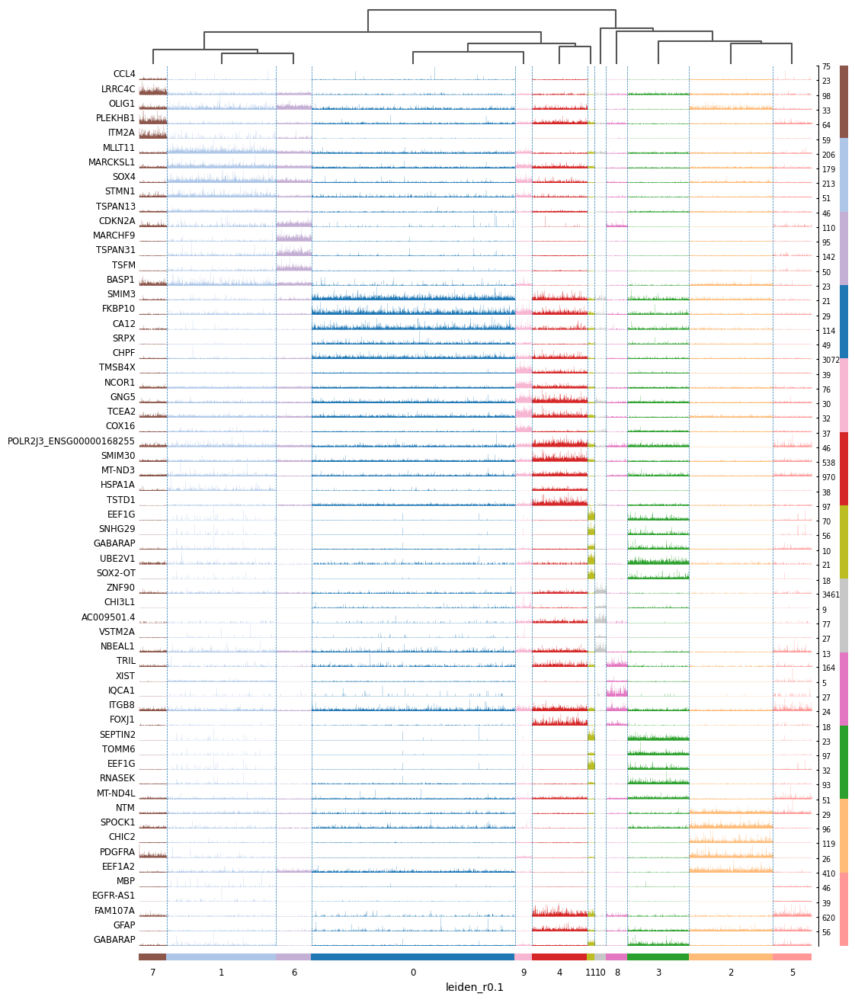

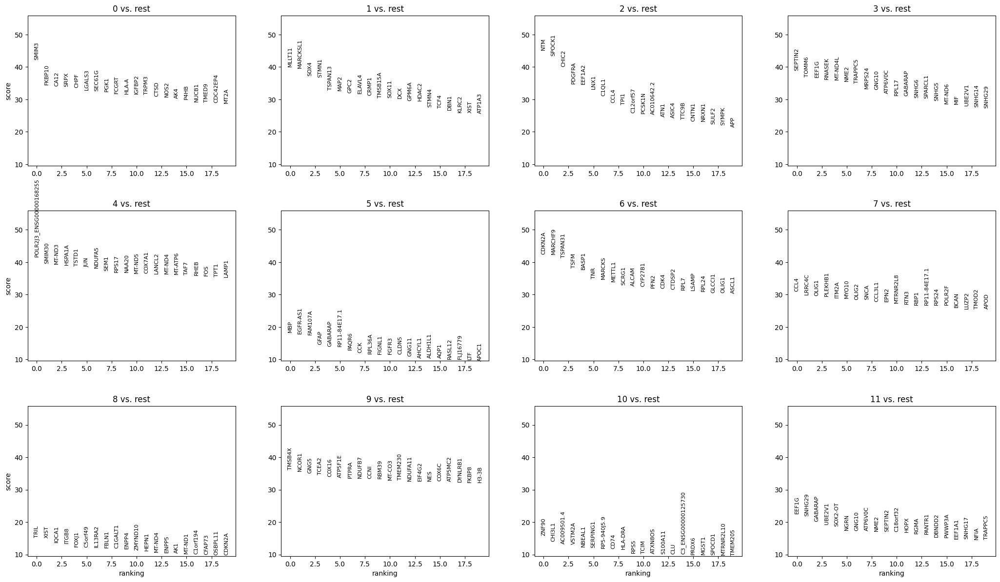

In [113]:
sc.tl.rank_genes_groups(
    adata_neoplastic,
    groupby = "leiden_r0.1",
    n_genes = 30
)


sc.pl.rank_genes_groups_tracksplot(
    adata_neoplastic,
    gene_symbols = "feature_name",
    n_genes = 5,
    save = "tracksplot_neoplastic.png"
    )

sc.pl.rank_genes_groups(
    adata_neoplastic,
    gene_symbols = "feature_name",
    n_genes = 20,
    save = "genegroups_neoplastic.png"
    )



c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\tools\_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


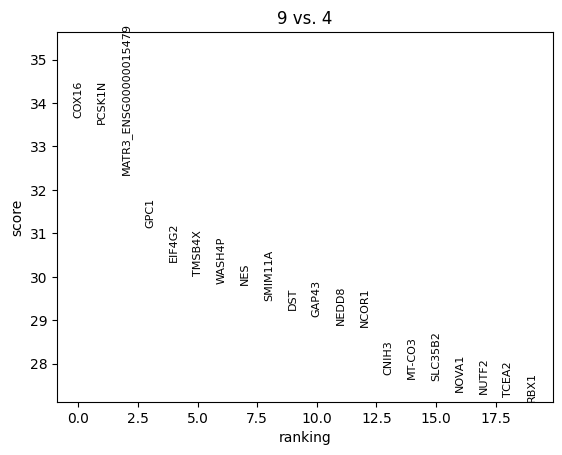

In [111]:
sc.tl.rank_genes_groups(
    adata_neoplastic,
    groupby = "leiden_r0.1",
    groups = ["9"],
    n_genes = 30,
    reference = "4" 
)

sc.pl.rank_genes_groups(
    adata_neoplastic,
    gene_symbols = "feature_name",
    n_genes = 20,
    save = "diff9vs4_neoplastic.png"
    )


c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\tools\_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


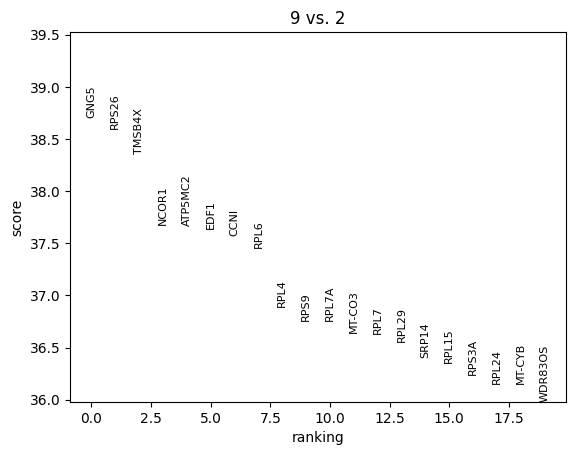

In [112]:
sc.tl.rank_genes_groups(
    adata_neoplastic,
    groupby = "leiden_r0.1",
    groups = ["9"],
    n_genes = 30,
    reference = "2" 
)

sc.pl.rank_genes_groups(
    adata_neoplastic,
    gene_symbols = "feature_name",
    n_genes = 20,
    save = "diff9vs2_neoplastic.png"
    )

# Selecting only AC-like and AC-like Prolif cells

In [7]:
target_ac_like = ["AC-like", "AC-like Prolif"]
adata_ac_like = adata_red[(adata_red.obs["annotation_level_4"].isin(target_ac_like))]

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


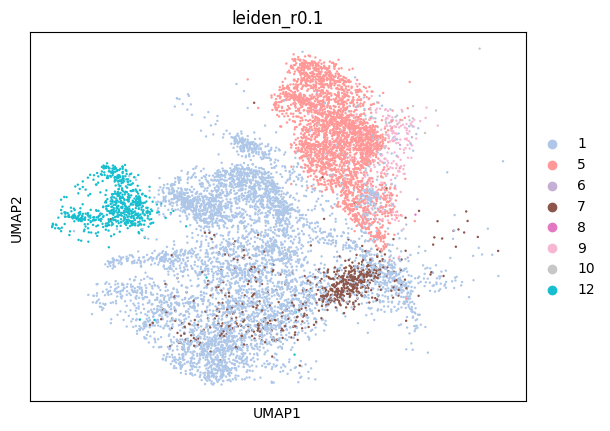

In [18]:
sc.pl.umap(
    adata_ac_like,
    color = "leiden_r0.1"
)

In [8]:
## normalize and cluster ##
adata_ac_like.X = adata_ac_like.raw.X.copy()
sc.pp.normalize_total(adata_ac_like, target_sum=1e4)
sc.pp.log1p(adata_ac_like)

sc.pp.neighbors(
    adata_ac_like, 
    n_neighbors = 9, 
    n_pcs = 21
    )

sc.tl.leiden(
    adata_ac_like,
    resolution = 0.1,
    key_added = "leiden_r0.1"
    )

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


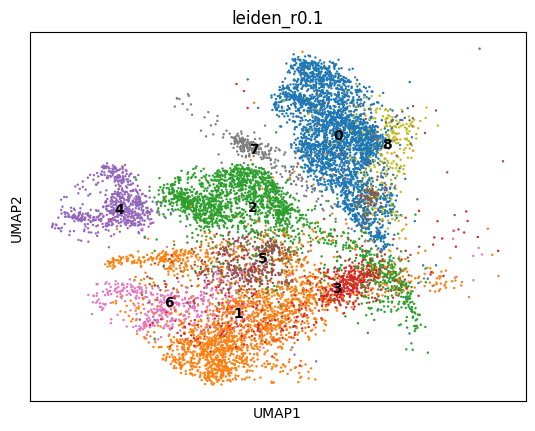

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


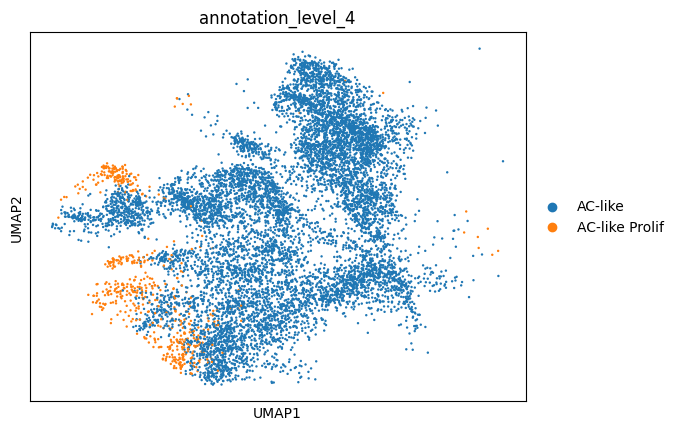

In [20]:
sc.pl.umap(
    adata_ac_like,
    color = "leiden_r0.1",
    legend_loc = "on data"
)

sc.pl.umap(
    adata_ac_like,
    color = "annotation_level_4"
)

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

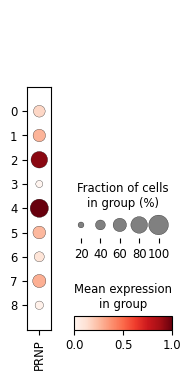

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()


c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


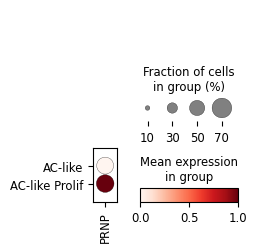

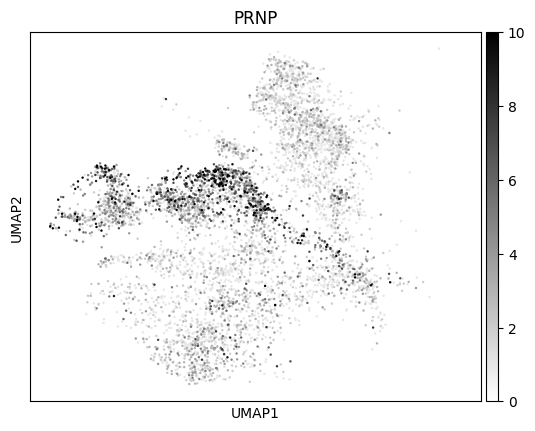

In [25]:
sc.pl.dotplot(
    adata_ac_like,
    "PRNP",
    groupby = "leiden_r0.1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "leiden_r0.1_prnp_aclike_dotplot.png"
)

sc.pl.dotplot(
    adata_ac_like,
    "PRNP",
    groupby = "annotation_level_4",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "annotation4_prnp_aclike_dotplot.png"
)

sc.pl.umap(
    adata_ac_like,
    color = ["PRNP"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 10,
    save = "UMAP_PRNP_aclike.png"
)

## DEGs analysis

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\tools\_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\get\get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\get\get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
c:\Users\LNCT\anaconda3\envs\ShaminiHands

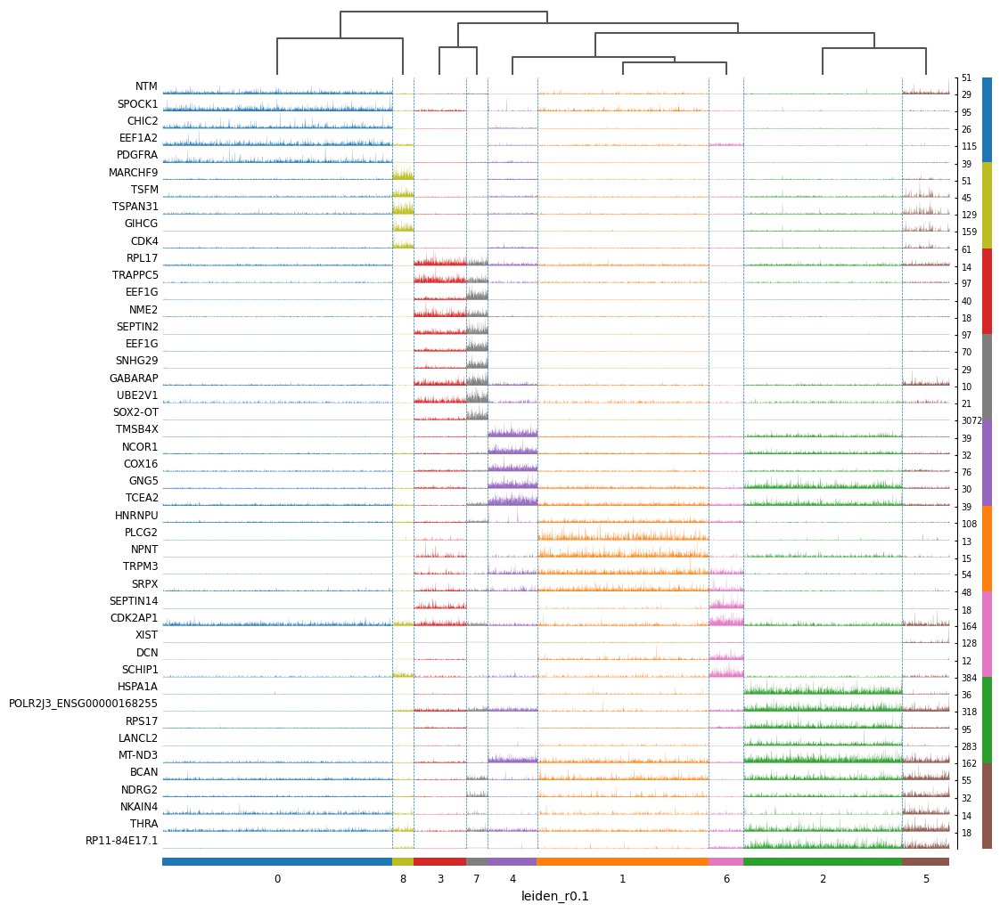

In [97]:
sc.tl.rank_genes_groups(
    adata_ac_like,
    groupby = "leiden_r0.1",
    n_genes = 30
)


sc.pl.rank_genes_groups_tracksplot(
    adata_ac_like,
    gene_symbols = "feature_name",
    n_genes = 5,
    save = "tracksplot_aclike.png"
    )

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


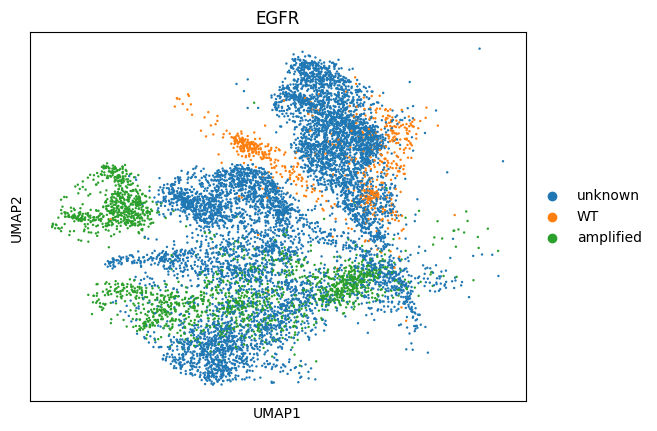

In [67]:
sc.pl.umap(
    adata_ac_like,
    color = "EGFR",
    save = "umap_egfr.png"
)


# Analysis using a higher leiden resolution

In [9]:
## normalize and cluster ##
adata_ac_like.X = adata_ac_like.raw.X.copy()
sc.pp.normalize_total(adata_ac_like, target_sum=1e4)
sc.pp.log1p(adata_ac_like)

sc.pp.neighbors(
    adata_ac_like, 
    n_neighbors = 9, 
    n_pcs = 21
    )

sc.tl.leiden(
    adata_ac_like,
    resolution = 1,
    key_added = "leiden_r0.1_res1"
    )

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


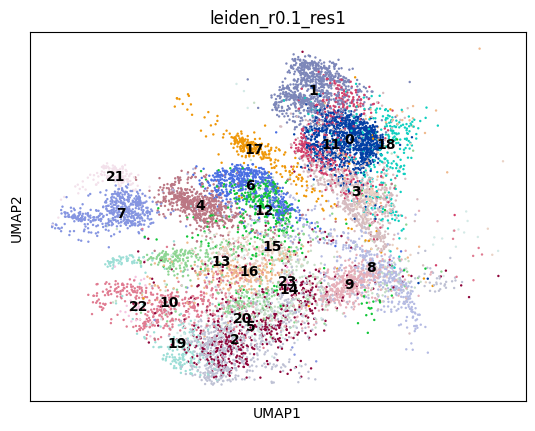

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

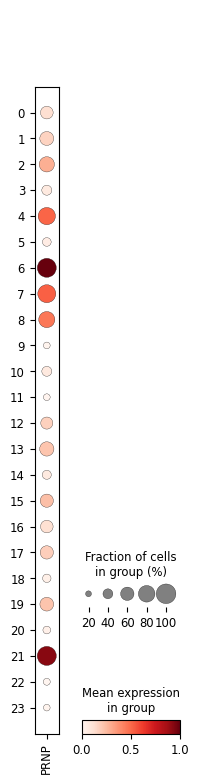

In [39]:
sc.pl.umap(
    adata_ac_like,
    color = "leiden_r0.1_res1",
    legend_loc = "on data",
    save = "umap_aclike_res1.png"
)

sc.pl.dotplot(
    adata_ac_like,
    "PRNP",
    groupby = "leiden_r0.1_res1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "prnp_dotplot_aclike_res1.png"
)

In [ ]:
# TFs NF-κB STAT3 HIF-1α  Proteinas CD44 N-cadherin # Master Regulators  C/EBPb STAT3

# PRNP and all

sc.pl.dotplot(
    adata_ac_like,
    ["PRNP", "NFKB1", "STAT3", "HIF1A", "CD44", "CDH2", "CEBPB"],
    groupby='leiden_r0.1_res1',
    dendrogram=True,
    gene_symbols="feature_name",
    #save="dotplot_MESTFS_PRNP_clusters.png",
    standard_scale = "var"
)


## DEGs analysis

In [ ]:
sc.tl.rank_genes_groups(
    adata_ac_like,
    groups = ["21"],
    reference = "7",
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

sc.pl.rank_genes_groups(
    adata_ac_like,
    n_genes = 20,
    gene_symbols = "feature_name",
    save = "generank_21vs7_aclike_res1.png"
)

sc.tl.rank_genes_groups(
    adata_ac_like,
    groups = ["21"],
    reference = "6",
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

sc.pl.rank_genes_groups(
    adata_ac_like,
    n_genes = 20,
    gene_symbols = "feature_name",
    save = "generank_21vs6_aclike_res1.png"
)

sc.tl.rank_genes_groups(
    adata_ac_like,
    groups = ["21"],
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

sc.pl.rank_genes_groups(
    adata_ac_like,
    n_genes = 20,
    gene_symbols = "feature_name",
    save = "generank_21vsrest_aclike_res1.png"
)

sc.tl.rank_genes_groups(
    adata_ac_like,
    groups = ["21"],
    reference = "22",
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)



sc.pl.rank_genes_groups(
    adata_ac_like,
    n_genes = 20,
    gene_symbols = "feature_name",
    save = "generank_21vs22_aclike_res1.png"
)

sc.tl.rank_genes_groups(
    adata_ac_like,
    groups = ["7"],
    reference = "rest",
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

sc.pl.rank_genes_groups(
    adata_ac_like,
    n_genes = 20,
    gene_symbols = "feature_name",
    save = "generank_7vsrest_aclike_res1.png"
)

sc.tl.rank_genes_groups(
    adata_ac_like,
    groups = ["6"],
    reference = "rest",
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

sc.pl.rank_genes_groups(
    adata_ac_like,
    n_genes = 20,
    gene_symbols = "feature_name",
    save = "generank_6vsrest_aclike_res1.png"
)

sc.tl.rank_genes_groups(
    adata_ac_like,
    groups = ["6"],
    reference = "21",
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

sc.pl.rank_genes_groups(
    adata_ac_like,
    n_genes = 20,
    gene_symbols = "feature_name",
    save = "generank_6vs21_aclike_res1.png"
)

## Membrane proteins analysis

In [ ]:
sc.pl.dotplot(
    adata_ac_like,
    ["PRNP","ITGB1",  "ITGB8", "ITGA6", "MMP2", "MMP7", "MMP9", "RHOA", "NCAM1", "L1CAM", "EPHA2"],
    groupby = "leiden_r0.1_res1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "dotplot_claragenes_res1.png"
)


# DOI: 10.1371/journal.pcbi.1010604

sc.pl.dotplot(
    adata_ac_like,
    ["PRNP", "PCNA",  "PLK1", "MKI67", "FEN1", "RRM1", "RRM2", "CDK1", "RPA2", "RFC4", "RFC2", "PRIM2", "POLA1", "RFC3", "RPA1", "RPA3", "RFC5", "SMC3", "STAG2", "SMC1A"],
    groupby = "leiden_r0.1_res1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "aclike_res1_prolifgenes.png"
)

# GProfiler - Pathway enrichment analysis

In [ ]:
sc.tl.rank_genes_groups(
    adata_ac_like,
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

df = sc.get.rank_genes_groups_df(
    adata_ac_like,
    gene_symbols = "feature_name",
    group = "6"
    )

df

In [ ]:
sc.tl.rank_genes_groups(
    adata_ac_like,
    groupby = "leiden_r0.1_res1",
    n_genes = 30
)

df_21 = sc.get.rank_genes_groups_df(
    adata_ac_like,
    gene_symbols = "feature_name",
    group = "21"
    )

df_21

In [20]:
gp21 = GProfiler(return_dataframe=True)
cluster21_pathways = gp21.profile(organism='hsapiens',
            query= ["YBX1", "TMSB4X", "HMGB1", "ANAPC11", "MKKS", "HMGN2", "TCEA2", "PRPSAP1", "HMGN1", "CCN1", "GPX4", "BANF1", "TUBA1B", "LSM4", "SUMO2", "H2AZ1", "MARCKSL1", "TMEM160", "SNX5", "PCBP2", "SNRPB"])

In [ ]:
cluster21_pathways

In [19]:
gp = GProfiler(return_dataframe=True)
cluster6_pathways = gp.profile(organism='hsapiens',
            query= ["PIFO", "MLF1", "AQP4", "PON2", "CETN2", "PLTP", "NTRK2", "PSENEN", "MORN2", "AK1", "S100B, GJA1", "DNER", "FHL1", "EZR", "SPAG16", "EFHC1", "KIF9", "ITM2B", "C7orf57", "ZMYND10", "MT-ND3", "PACRG", "RSPH1", "PTPRN2", "C1orf194", "LRRIQ1", "TUBB4B", "FAM229B", "CFAP126"])

In [33]:
df_cluster7 = sc.get.rank_genes_groups_df(
    adata_ac_like,
    gene_symbols = "feature_name",
    group = "7"
    )

df_cluster7["feature_name"].to_excel("genes_cluster7.xlsx")

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\get\get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()


In [36]:
gp2 = GProfiler(return_dataframe=True)
cluster7_pathways = gp2.profile(organism='hsapiens',
            query= ["NCOR1", "COX16", "TMSB4X", "H33B", "GNG5", "EIF4G2", "MATR3", "CCNI", "MT-CO3", "ATP5MC2", "TCEA2", "PTPRA", "RBM39", "MT-CYB", "NES", "MRPL23", "GPC1", "SUMO2", "SLC35B2", "DDX5", "RPL4", "SERF2", "ANAPC11", "CFL1", "POLDIP2", "SRSF2", "COX6C", "SRSF9", "DYNLRB1", "FKBP8"]

)

In [ ]:
gp21 = GProfiler(return_dataframe=True)
cluster7_pathways = gp2.profile(organism='hsapiens',
            query= ["NCOR1", "COX16", "TMSB4X", "H33B", "GNG5", "EIF4G2", "MATR3", "CCNI", "MT-CO3", "ATP5MC2", "TCEA2", "PTPRA", "RBM39", "MT-CYB", "NES", "MRPL23", "GPC1", "SUMO2", "SLC35B2", "DDX5", "RPL4", "SERF2", "ANAPC11", "CFL1", "POLDIP2", "SRSF2", "COX6C", "SRSF9", "DYNLRB1", "FKBP8"]

)

In [ ]:
cluster6_pathways
#cluster6_pathways.to_csv("cluster6_pathways.csv")

In [37]:
cluster7_pathways
cluster7_pathways.to_csv("cluster7_pathways.csv")

In [ ]:
cluster7_pathways

# Ciliogenesis - Cluster 6

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

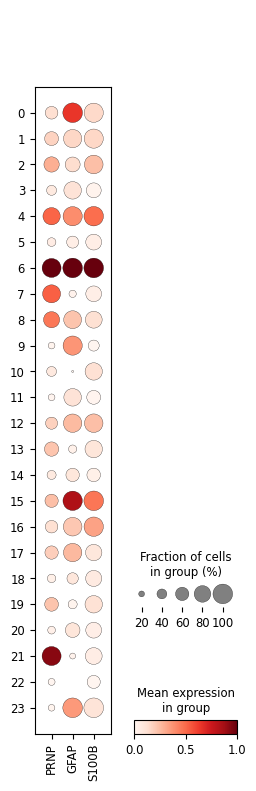

In [18]:
# Diff Markers

sc.pl.dotplot(
    adata_ac_like,
    ["PRNP","GFAP", "S100B"],
    groupby = "leiden_r0.1_res1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "dotplot_aclike_res1_diffmarkers.png"
)

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

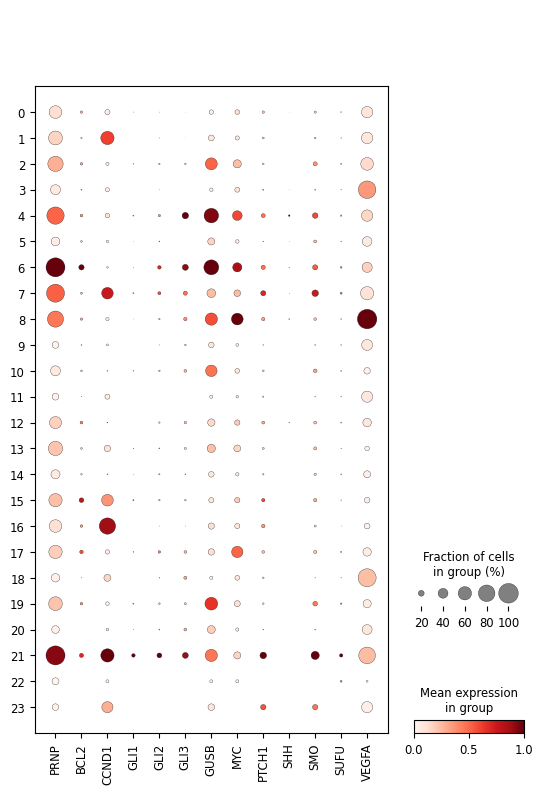

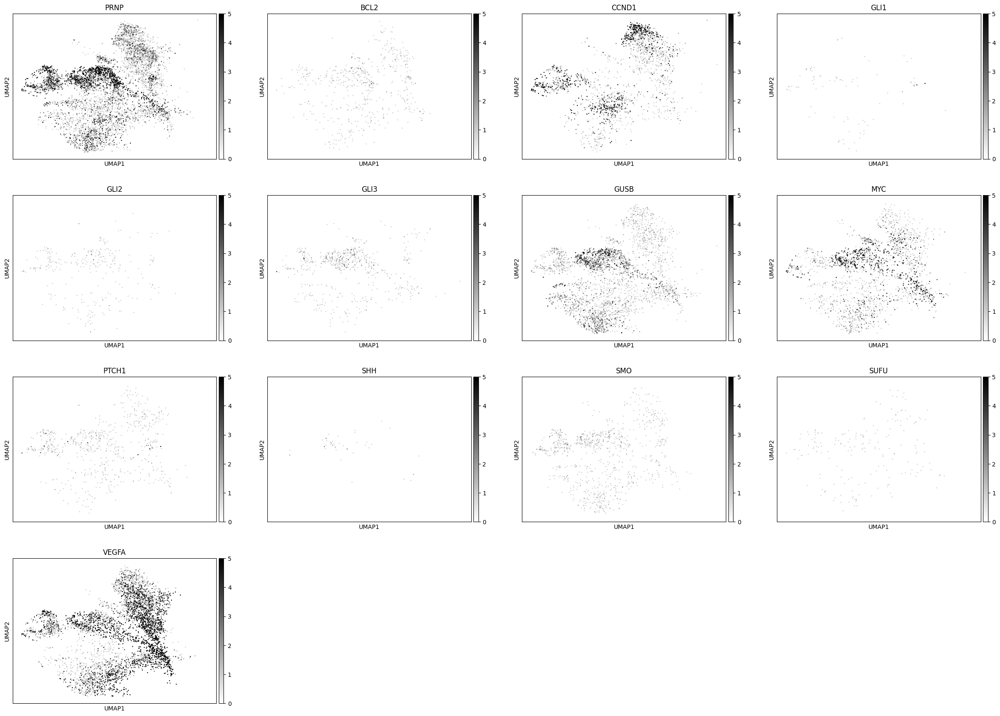

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()


c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


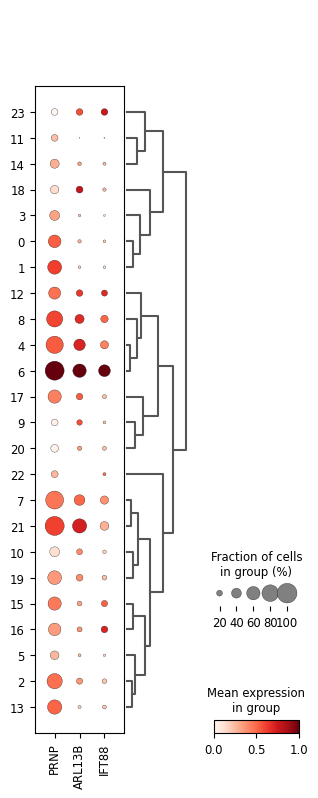

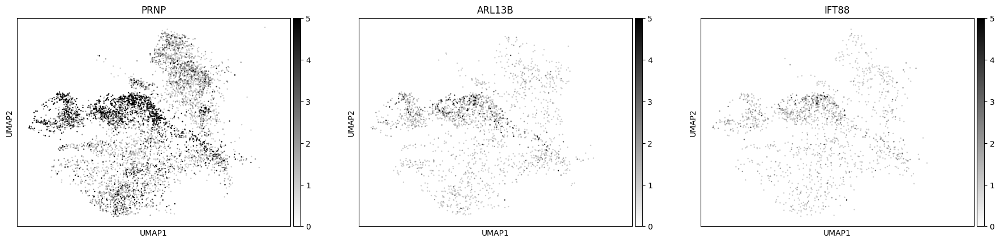

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

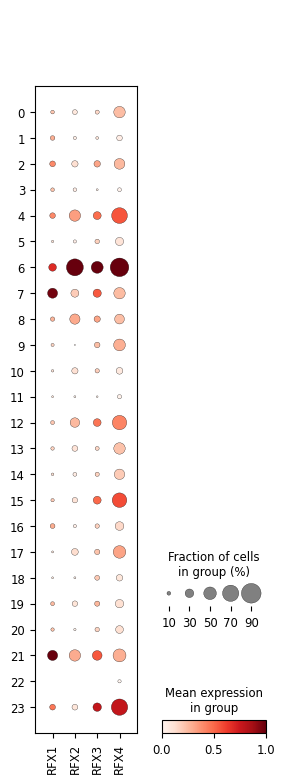

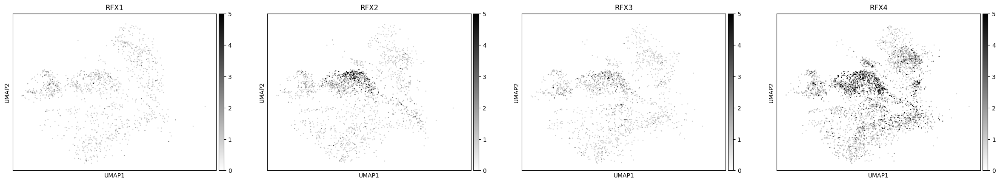

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

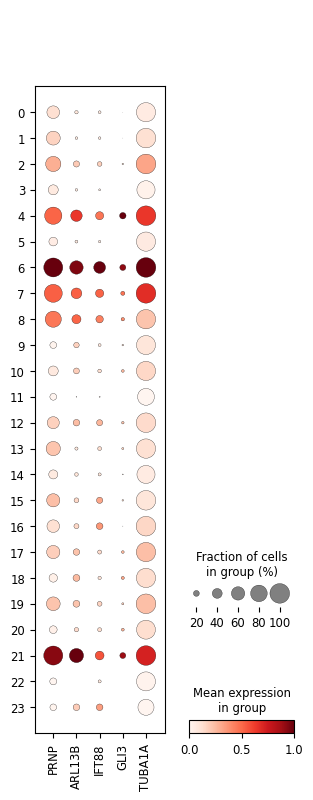

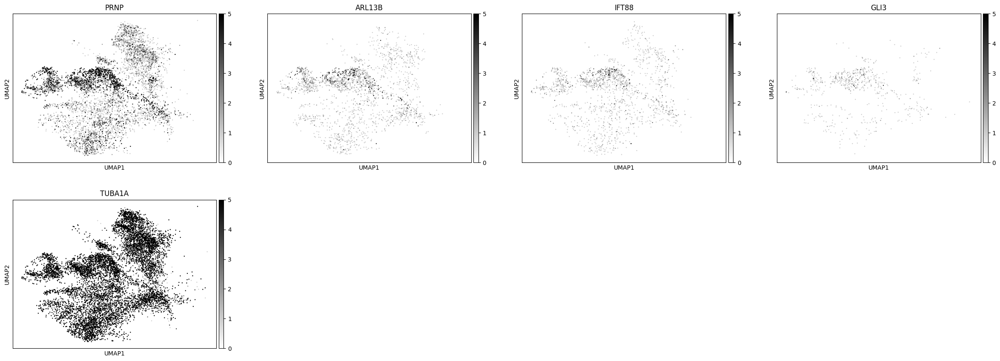

In [29]:
#SHH Pathway

sc.pl.dotplot(
    adata_ac_like,
    ["PRNP","BCL2", "CCND1", "GLI1", "GLI2", "GLI3", "GUSB", "MYC", "PTCH1", "SHH", "SMO", "SUFU", "VEGFA"],
    groupby = "leiden_r0.1_res1",
    gene_symbols = "feature_name",
    standard_scale = "var",
)

sc.pl.umap(
    adata_ac_like,
    color = ["PRNP","BCL2", "CCND1", "GLI1", "GLI2", "GLI3", "GUSB", "MYC", "PTCH1", "SHH", "SMO", "SUFU", "VEGFA"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 5,
    save = "umap_shh_aclike.png"
)

# Primary cilium assembly

sc.pl.dotplot(
    adata_ac_like,
    ["PRNP","ARL13B", "IFT88"],
    groupby='leiden_r0.1_res1',
    dendrogram=True,
    use_raw = False,
    gene_symbols="feature_name",
    standard_scale = "var",
    save = "dotplot_res1_arl13b_IFT88_aclike.png"
)

sc.pl.umap(
    adata_ac_like,
    color = ["PRNP","ARL13B", "IFT88"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 5,
    save = "umap_arl13b_ift88_aclike.png"
)

sc.pl.dotplot(
    adata_ac_like,
    ["RFX1", "RFX2", "RFX3", "RFX4"],
    groupby = "leiden_r0.1_res1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "dotplot_res1_rfx_aclike.png"
)

sc.pl.umap(
    adata_ac_like,
    color = ["RFX1", "RFX2", "RFX3", "RFX4"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 5,
    save = "umap_rfx_aclike.png"
)

sc.pl.dotplot(
    adata_ac_like,
    ["PRNP", "ARL13B", "IFT88", "GLI3", "TUBA1A"],
    groupby = "leiden_r0.1_res1",
    gene_symbols = "feature_name",
    standard_scale = "var",
    save = "dotplot_cilium_markers_aclike.png"
   
)

sc.pl.umap(
    adata_ac_like,
    color = ["PRNP", "ARL13B", "IFT88", "GLI3", "TUBA1A"],
    legend_loc = "right margin",
    gene_symbols = "feature_name",
    color_map = "gist_yarg",
    vmax = 5,
    save = "umap_cilium_markers_aclike.png"
)


In [30]:
adata_ac_like

AnnData object with n_obs × n_vars = 9978 × 28045
    obs: 'author', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'stage', 'location', 'sector', 'sample', 'celltype_original', 'iCNV', 'EGFR', 'MET', 'p53', 'TERT', 'ATRX', 'PTEN', 'MGMT', 'KI_67', 'chr1p19q', 'PDGFR', 'suspension_type', 'donor_id', 'annotation_level_3', 'annotation_level_4', 'annotation_level_2', 'annotation_level_1', 'tissue_ontology_term_id', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'leiden_r0.1', 'leiden_r0.1_res1'
    var: 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'feature_is_filtered', 'feature_name', 'feature_refer

## Molecular subtypes high resolution

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. 

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


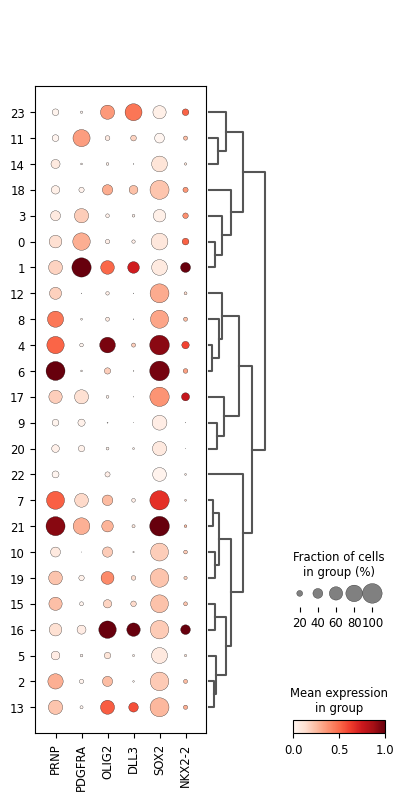

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

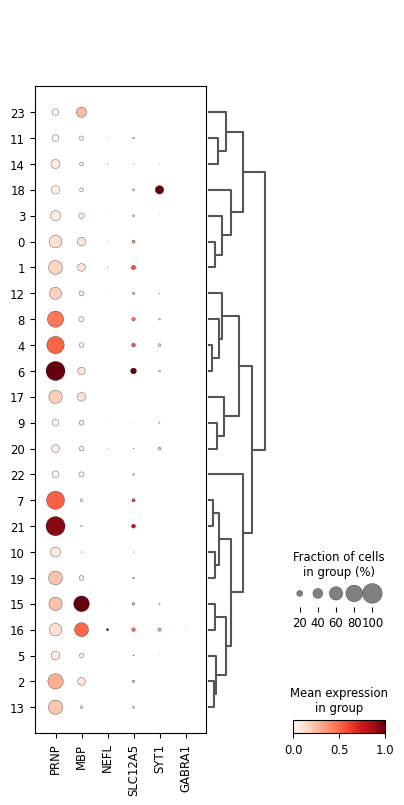

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

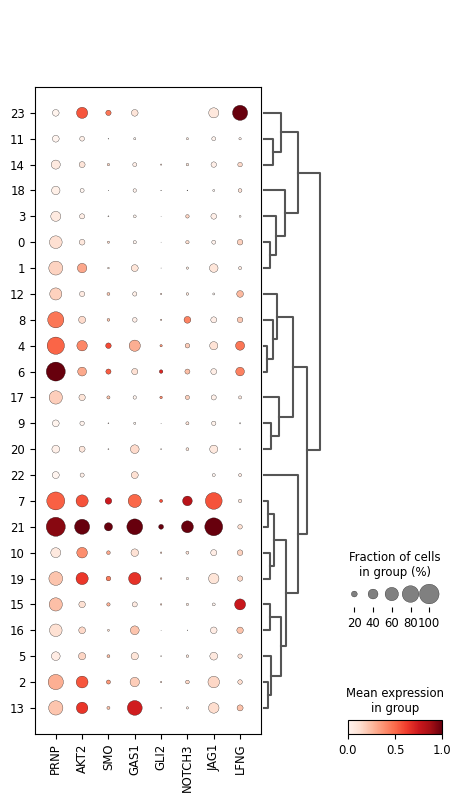

c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
c:\Users\LNCT\anaconda3\envs\ShaminiHandsOn\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

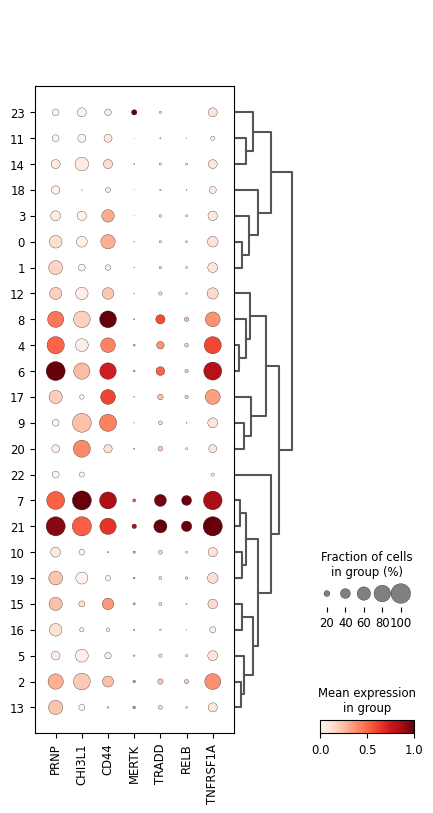

In [29]:
sc.pl.dotplot(
    adata_ac_like,
    markers_proneural,
    groupby='leiden_r0.1_res1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_proneural_PRNP_clusters_res1.png",
    standard_scale = "var"
)



##########
sc.pl.dotplot(
    adata_ac_like,
    markers_proliferative,
    groupby='leiden_r0.1_res1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_prolif_PRNP_clusters_res1.png",
    standard_scale = "var"
)


###########
sc.pl.dotplot(
    adata_ac_like,
    markers_classical,
    groupby='leiden_r0.1_res1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_classic_PRNP_clusters_res1.png",
    standard_scale = "var"
)



###########
sc.pl.dotplot(
    adata_ac_like,
    markers_mesenchymal,
    groupby='leiden_r0.1_res1',
    dendrogram=True,
    gene_symbols="feature_name",
    save="dotplot_mes_PRNP_clusters_res1.png",
    standard_scale = "var"
)

